# Re-creating Sections of Snowplow Maps

Plotting documentation: https://osmnx.readthedocs.io/en/stable/user-reference.html

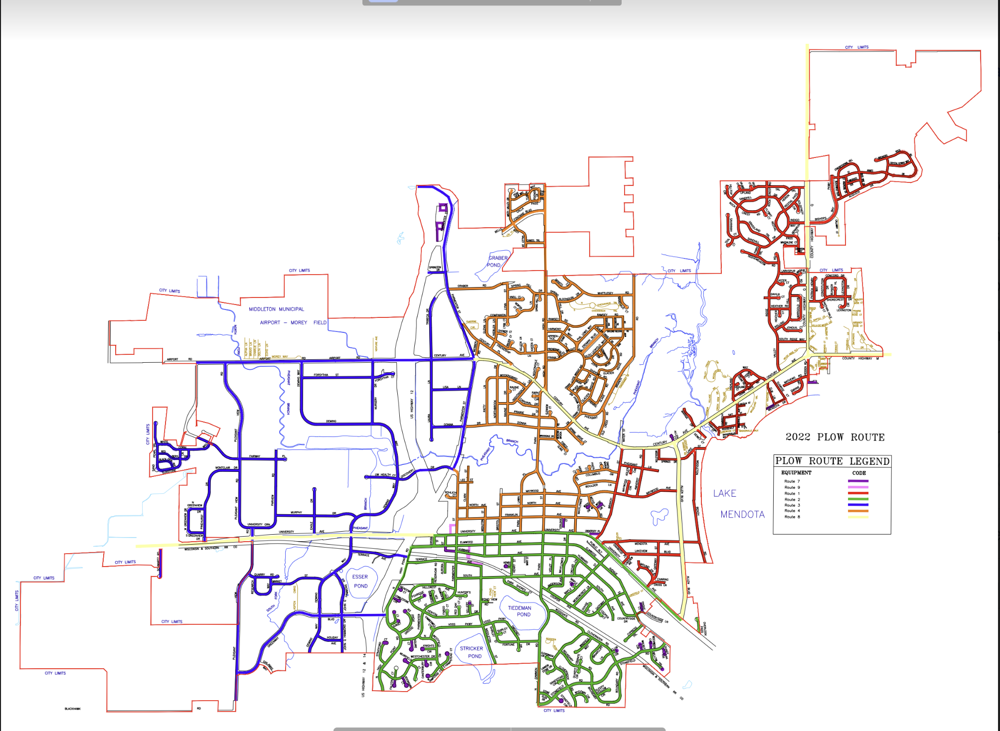

Imports

In [74]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import shapely
import osmnx as ox
import pickle

In [75]:
import sectioning
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load Original Full Streets GDF Data

In [76]:
nodes, edges, G_osm = sectioning.get_full_streets_nodes_edges()
map_instance = edges.explore()
map_instance

In [77]:
edges[edges['culdesac']].explore()

## Extracting Routes

Starting with the blue route:

In [78]:
blue_route_filepath = "C:\\Users\\Sneez\\Desktop\\Snowplowing\\Data+Info\\GIS Data\\IndividualRoutes\\MiddletonRoute3-blue.gpkg"
blue_route_gdf: gpd.GeoDataFrame = gpd.read_file(blue_route_filepath)
blue_route_polygon: shapely.Polygon = blue_route_gdf.iloc[0]['geometry']

In [79]:
G_blue = sectioning.create_sectioned_component(G_osm, nodes, edges, blue_route_polygon)
G_blue = sectioning.config_sectioned_component(G_blue)
print(G_blue)
ox.graph_to_gdfs(G_blue, nodes=False).explore(color='blue', m=map_instance)

MultiDiGraph with 163 nodes and 332 edges


Orange route:

In [80]:
orange_route_filepath = "C:\\Users\\Sneez\\Desktop\\Snowplowing\\Data+Info\\GIS Data\\IndividualRoutes\\MiddletonRoute4-orange.gpkg"
G_orange = sectioning.section_component(orange_route_filepath)
print(G_orange)

MultiDiGraph with 291 nodes and 708 edges


In [81]:
ox.graph_to_gdfs(G_orange, nodes=False).explore(color='orange', m=map_instance)

In [84]:
red_route_filepath = "C:\\Users\\Sneez\\Desktop\\Snowplowing\\Data+Info\\GIS Data\\IndividualRoutes\\MiddletonRoute1-Red.gpkg"
G_red = sectioning.section_component(red_route_filepath)
print(G_red)

MultiDiGraph with 228 nodes and 534 edges


In [85]:
ox.graph_to_gdfs(G_red, nodes=False).explore(color='red', m=map_instance)

In [106]:
green_route_filepath = "C:\\Users\\Sneez\\Desktop\\Snowplowing\\Data+Info\\GIS Data\\IndividualRoutes\\MiddletonRoute2-green_labeled.gpkg"
G_green = sectioning.section_component(green_route_filepath, True)
print(G_green)

MultiDiGraph with 262 nodes and 586 edges


In [107]:
ox.graph_to_gdfs(G_green, nodes=False).explore(color='green', m=map_instance)